In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import json
import os
import glob
import cv2
import sys
sys.path.insert(0, "/home/lab530/KenYu/ml_toolkit/kitti")
from util_kitti import init_img_plt_with_plasma

N_IMG_SHOW = 10

# Choose a image to visualize # frankfurt_000001_044658
# IMG_NAME = 'val/frankfurt/frankfurt_000001_044658'
SEG_LABEL_PATH = '/home/lab530/KenYu/cityscapes/gtFine'
DIS_LABEL_PATH = '/home/lab530/KenYu/cityscapes/disparity'
CAMERA_PATH    = '/home/lab530/KenYu/cityscapes/camera'
IMG_PATH       = '/home/lab530/KenYu/cityscapes/leftImg8bit'
IMG_PATH_RIGHT = '/home/lab530/KenYu/cityscapes/rightImg8bit'

def get_all_file_paths(directory):
    file_paths = [
        os.path.join("val", file.split("_")[0], f"{file.split('_')[0]}_{file.split('_')[1]}_{file.split('_')[2]}")
        for root, _, files in os.walk(directory)
        for file in files]
    return file_paths

def load_disparity(disparity_path):
    dis_label = cv2.imread(disparity_path, cv2.IMREAD_UNCHANGED) # read the 16-bit disparity png file
    dis_label = np.array(dis_label).astype(np.float) 
    dis_label[dis_label > 0] = (dis_label[dis_label > 0] - 1) / 256 # convert the png file to real disparity values, according to the official documentation. 
    return dis_label

def convert_disparity_to_depth(dis_label, camera):
    # Convert disparity map to depth map
    # print(camera)
    depth = camera['extrinsic']['baseline'] * camera['intrinsic']['fx'] / dis_label

    # zero mean don't care pixels
    depth[depth == np.inf] = 0
    depth[depth == np.nan] = 0
    # Cap at 100m
    depth = np.minimum(depth, 80)

    # Eliminate the pixels that are too far away and is on the boundary of the image
    THRESHOLD = 40
    depth[        :, :90][depth[        :, :90] > THRESHOLD] = 0
    depth[1024-180:, :  ][depth[1024-180:, :  ] > THRESHOLD] = 0
    return depth 



import random
all_name = get_all_file_paths( os.path.join(IMG_PATH, "val"))
print(f"all_name = {len(all_name)}") # 500
choose_name = random.choices(all_name, k = N_IMG_SHOW)
choose_name[0] = "val/frankfurt/frankfurt_000001_048355"
print(choose_name)


all_name = 500
['val/munster/munster_000017_000019', 'val/frankfurt/frankfurt_000001_066574', 'val/frankfurt/frankfurt_000001_041074', 'val/munster/munster_000086_000019', 'val/frankfurt/frankfurt_000001_068208', 'val/frankfurt/frankfurt_000001_041354', 'val/frankfurt/frankfurt_000001_007857', 'val/frankfurt/frankfurt_000001_007622', 'val/frankfurt/frankfurt_000000_003920', 'val/munster/munster_000085_000019']


# Visualize the image

/home/lab530/anaconda3/envs/KenYuGAC/lib/python3.7/site-packages/ipykernel_launcher.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/lab530/anaconda3/envs/KenYuGAC/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in true_divide


[<AxesSubplot:>]

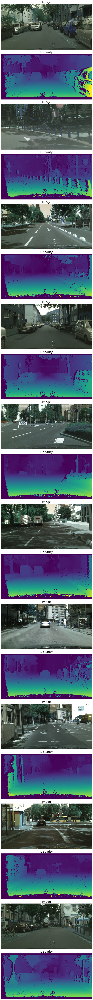

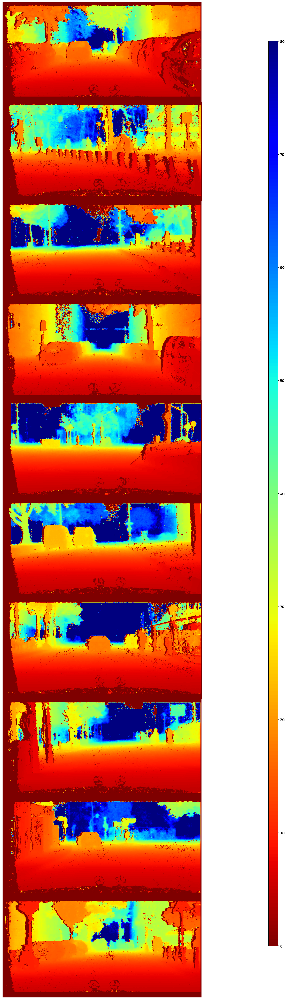

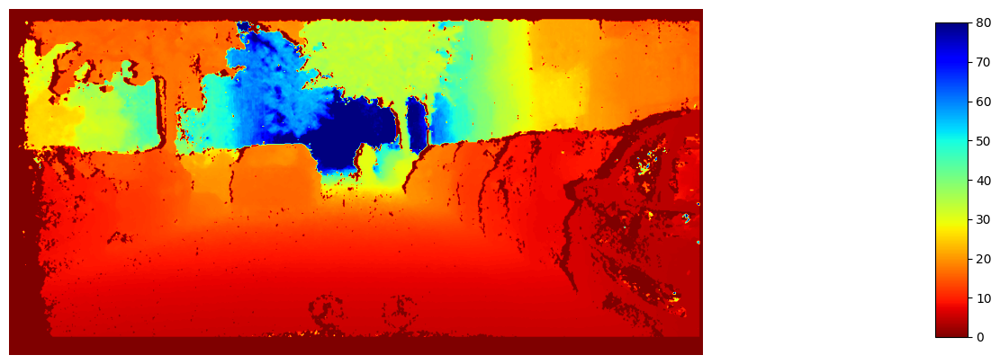

In [2]:
num_plot = 2*len(choose_name)
# Display the original and rotated images using Matplotlib
fig, axs = plt.subplots(num_plot, 1, figsize=(18, 5*num_plot), dpi=100)
fig.set_facecolor('white')
fig.tight_layout()

depths = []

for i, img_name in enumerate(choose_name):
    imgL       = cv2.imread( os.path.join(IMG_PATH      , img_name + "_leftImg8bit.png") )

    seg_label = cv2.imread( os.path.join(SEG_LABEL_PATH, img_name + "_gtFine_instanceIds.png") )
    camera    = json.load( open( os.path.join(CAMERA_PATH, img_name + "_camera.json") ) )

    dis_label = load_disparity( os.path.join(DIS_LABEL_PATH, img_name + "_disparity.png") )
    depth = convert_disparity_to_depth(dis_label, camera)
    # # # 
    # dis_label = cv2.imread( os.path.join(DIS_LABEL_PATH, img_name + "_disparity.png"), cv2.IMREAD_UNCHANGED) # read the 16-bit disparity png file
    # dis_label = np.array(dis_label).astype(np.float) 
    # dis_label[dis_label > 0] = (dis_label[dis_label > 0] - 1) / 256 # convert the png file to real disparity values, according to the official documentation. 

    # # Convert disparity map to depth map
    # # print(camera)
    # depth = camera['extrinsic']['baseline'] * camera['intrinsic']['fx'] / dis_label

    # # zero mean don't care pixels
    # depth[depth == np.inf] = 0
    # depth[depth == np.nan] = 0
    # # Cap at 100m
    # depth = np.minimum(depth, 80)

    axs[2*i].axis('off')
    axs[2*i].imshow(imgL)
    axs[2*i].set_title( "Image", fontsize = 20 )

    axs[2*i+1].axis('off')
    axs[2*i+1].imshow(dis_label)
    axs[2*i+1].set_title( "Disparity", fontsize = 20 )

    # # Eliminate the pixels that are too far away and is on the boundary of the image
    # THRESHOLD = 40
    # depth[        :, :90][depth[        :, :90] > THRESHOLD] = 0
    # depth[1024-180:, :  ][depth[1024-180:, :  ] > THRESHOLD] = 0
    
    
    depths.append(depth)

init_img_plt_with_plasma(depths)

init_img_plt_with_plasma([depths[0]])

## Try to evaluate the depth estimatino result

In [3]:
import cv2

pd_depth_dir = "/home/lab530/KenYu/detectron2/projects/Panoptic-DeepLab/output/inference/predictions/"
# pd_depth_dir = "/home/lab530/KenYu/detectron2/projects/Panoptic-DeepLab/output_depthlab_L1loss/inference/predictions/"
gt_depth_dir = "/home/lab530/KenYu/cityscapes/disparity/val/"
camera_dir   = "/home/lab530/KenYu/cityscapes/camera/val/"

import os 
img_names = ["_".join(fn.split("_")[:3]) for fn in os.listdir(pd_depth_dir) if "_leftImg8bit_depth.png" in fn ]
print(img_names)
print(f"Found {len(img_names)} image in prediction directory")


def calculate_rse(gt_depth, pd_depth):
    # Calculate squared differences between predicted and true values
    squared_diff = np.square(pd_depth - gt_depth)
    
    # Calculate squared differences between true values and their mean
    squared_diff_mean = np.square(gt_depth - np.mean(gt_depth))
    
    # Calculate RSE
    rse = np.sum(squared_diff) / np.sum(squared_diff_mean)
    
    return rse

def calculate_rae(gt_depth, pd_depth):
    # Calculate absolute differences between predicted and true values
    abs_diff = np.abs(pd_depth - gt_depth)
    
    # Calculate absolute differences between true values and their mean
    abs_diff_mean = np.abs(gt_depth - np.mean(gt_depth))
    
    # Calculate absErrorRel
    abs_error_rel = np.sum(abs_diff) / np.sum(abs_diff_mean)
    
    return abs_error_rel

def calculate_irmse(gt_depth, pd_depth):    
    # print(f"np.any(gt_depth == 0) = {np.any(gt_depth == 0)}")
    # print(f"np.any(pd_depth == 0) = {np.any(pd_depth == 0)}")
    # Calculate inverse depth arrays
    inv_gt_depth = 1.0 / gt_depth
    inv_pd_depth = 1.0 / pd_depth
    
    # Calculate squared differences between inverse depths
    squared_diff = np.square(inv_pd_depth - inv_gt_depth)
    
    # Calculate mean squared error
    mse = np.mean(squared_diff)
    
    # Calculate iRMSE
    irmse = np.sqrt(mse)
    
    # Scale iRMSE to [1/km] units
    irmse_scaled = irmse * 1000.0
    
    return irmse_scaled

def calculate_silog(gt_depth, pd_depth):
    # Compute logarithm of predicted and ground truth depth values
    log_pd_depth = np.log10(pd_depth)
    log_gt_depth = np.log10(gt_depth)

    # Calculate absolute logarithmic differences
    abs_log_diff = np.abs(log_pd_depth - log_gt_depth)

    # Compute mean absolute logarithmic difference
    mean_abs_log_diff = np.mean(abs_log_diff)

    # Scale mean absolute logarithmic difference by 100 to obtain SILog
    silog = mean_abs_log_diff * 100

    return silog

def calculate_depth_threshold_accuracy(gt_depth, pd_depth , threshold=1.25):
    
    # Calculate the maximum ratio between predicted and ground truth depths
    max_ratio = np.maximum(pd_depth / gt_depth, gt_depth / pd_depth)
    
    # Count the number of pixels below the threshold
    num_below_threshold = np.sum(max_ratio < threshold)
    
    # Calculate the depth threshold accuracy as a percentage
    depth_threshold_accuracy = (num_below_threshold / max_ratio.size) * 100
    
    return depth_threshold_accuracy

RSE = 0
RAE = 0
IRMSE = 0
SILog = 0
ACC_1 = 0
ACC_2 = 0
ACC_3 = 0

for i_img, img_name in enumerate(img_names):
    
    pd_depth_path = os.path.join(pd_depth_dir, img_name + "_leftImg8bit_depth.png")
    gt_depth_path = os.path.join(gt_depth_dir, img_name.split("_")[0], img_name + "_disparity.png")
    camera    = json.load( open( os.path.join(camera_dir, img_name.split("_")[0], img_name + "_camera.json") ) )
    
    # Process the ground truth depth map
    dis_map = load_disparity(gt_depth_path)
    gt_depth = convert_disparity_to_depth(dis_map, camera)

    # Load depth prediction result 
    pd_depth = cv2.imread(pd_depth_path, cv2.IMREAD_GRAYSCALE)

    # Output
    # init_img_plt_with_plasma([pd_depth, gt_depth])

    non_zero_indices = np.nonzero(gt_depth)
    gt_depth = gt_depth[ non_zero_indices ]
    pd_depth = pd_depth[ non_zero_indices ]
    
    # Avoid zero depth in prediction map
    pd_depth = np.where(pd_depth == 0, 0.1, pd_depth)
    
    assert pd_depth.shape == gt_depth.shape, "Depth maps must have the same shape"    

    RSE   += calculate_rse    (gt_depth, pd_depth) / len(img_names)
    RAE   += calculate_rae    (gt_depth, pd_depth) / len(img_names)
    IRMSE += calculate_irmse  (gt_depth, pd_depth) / len(img_names)
    SILog += calculate_silog  (gt_depth, pd_depth) / len(img_names)
    ACC_1 += calculate_depth_threshold_accuracy(gt_depth, pd_depth, threshold=1.25) / len(img_names)
    ACC_2 += calculate_depth_threshold_accuracy(gt_depth, pd_depth, threshold=1.25**2) / len(img_names)
    ACC_3 += calculate_depth_threshold_accuracy(gt_depth, pd_depth, threshold=1.25**3) / len(img_names)
    # print(f"processed {i_img}/{len(img_names)}")
    
print(f"RSE = {RSE}")
print(f"RAE = {RAE}")
print(f"IRMSE = {IRMSE}")
print(f"SILog = {SILog}")
print(f"ACC_1 = {ACC_1}")
print(f"ACC_2 = {ACC_2}")
print(f"ACC_3 = {ACC_3}")



['frankfurt_000000_018797', 'frankfurt_000000_009291', 'frankfurt_000001_002759', 'frankfurt_000000_003357', 'frankfurt_000000_009969', 'frankfurt_000001_004736', 'frankfurt_000000_001016', 'frankfurt_000000_001236', 'frankfurt_000000_011074', 'frankfurt_000000_011810', 'frankfurt_000000_020321', 'frankfurt_000000_012868', 'frankfurt_000000_021667', 'frankfurt_000000_021879', 'frankfurt_000001_005184', 'frankfurt_000000_013067', 'frankfurt_000000_017228', 'frankfurt_000001_004859', 'frankfurt_000000_012009', 'frankfurt_000000_013382', 'frankfurt_000001_003588', 'frankfurt_000000_010351', 'frankfurt_000000_003025', 'frankfurt_000001_007407', 'frankfurt_000000_003920', 'frankfurt_000000_020215', 'frankfurt_000000_015389', 'frankfurt_000000_022254', 'frankfurt_000000_011461', 'frankfurt_000001_005410', 'frankfurt_000000_020880', 'frankfurt_000001_005898', 'frankfurt_000000_009688', 'frankfurt_000000_005898', 'frankfurt_000000_016286', 'frankfurt_000000_014480', 'frankfurt_000000_001751', 

/home/lab530/anaconda3/envs/KenYuGAC/lib/python3.7/site-packages/ipykernel_launcher.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/lab530/anaconda3/envs/KenYuGAC/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in true_divide


RSE = 0.45647913646133526
RAE = 0.5334052143967912
IRMSE = 50.26857531072073
SILog = 19.282375792593857
ACC_1 = 30.470929533900836
ACC_2 = 53.60497342219761
ACC_3 = 75.40612243248113
